# Stochastic stranding
__Суммарное количество баллов: 8__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[HSE][ML][HW11] <ФИ>`, где вместо `<ФИ>` указаны фамилия и имя__

По бескрайним каменным джунглям от заказа к заказу бродят курьеры. Их задача - как можно быстрее доставить все заказы, чтобы взять новые. Ничто не может заставить их покинуть вечный цикл доставки.

In [ ]:
import numpy as np
import pandas
import random
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
import matplotlib
import copy
from itertools import permutations

In [ ]:
def get_colors(distances, alpha=True):
    normed = np.array(distances) - np.min(distances)
    normed = normed / np.max(normed)
    alpha = 1/np.mean([len(row) for row in normed])**0.5 if alpha else 1.
    return [[((1. if n > 0.5 else 2 * n), (1. if n < 0.5 else 2 - 2*n), 0., alpha) 
             for n in row] for row in normed]

def get_coords(points):
    results = []
    for pts in points:
        x_prev, _ = pts[0]
        result = [pts[0]]
        for x, y in list(pts[1:]) + [pts[0]]:
            result.append((x_prev, y))
            result.append((x, y))
            x_prev = x
        results.append(list(zip(*result)))
    return results

def init_figure(X):
    upper_bound, lower_bound = X.max(axis=0) + 1, X.min(axis=0) - 1
    fig, ax = plt.subplots(figsize=(10, 10), nrows=1, ncols=1)
    #ax.set_facecolor((0.1, 0.1, 0.1))
    ax.grid(True)
    #ax.grid(True, color=(0.9, 0.9, 0.9))
    ax.set_xticks(range(lower_bound[0], upper_bound[0]))
    ax.set_yticks(range(lower_bound[1], upper_bound[1]))
    ax.set_xlim(lower_bound[0], upper_bound[0])
    ax.set_ylim(lower_bound[1], upper_bound[1])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.scatter(X[:, 0], X[:, 1], color=(0, 0, 1))
    plt.tight_layout()
    return fig, ax    

def visualize_hillclimb(X, hillclimb):
    fig, ax = init_figure(X)
    permutations = hillclimb.optimize_explain(X)
    colors = get_colors([[cyclic_distance(X[p], hillclimb.dist) for p in permutations]], False)[0]
    coords = get_coords([X[p] for p in permutations])
    plot = ax.plot(coords[0][0], coords[0][1], color=colors[0])[0]
    
    def animate(i):
        plot.set_color(colors[i])
        plot.set_data(*coords[i])
        return (plot,)
    
    return animation.FuncAnimation(fig, animate, frames=len(permutations), interval=100, blit=True)

def visualize_genetic(X, genetic):
    fig, ax = init_figure(X)
    populations = genetic.optimize_explain(X)
    distances = [[cyclic_distance(X[p], genetic.dist) for p in populations[i]] for i in range(len(populations))]
    colors = get_colors(distances)
    coords = get_coords([X[p] for p in populations[0]])
    plots = [ax.plot(x, y, color=c)[0] for (x, y), c in zip(coords, colors[0])]
    best_id = np.argmin(distances[0])
    best_plot = ax.plot(*coords[best_id], color=(0.3, 0.3, 1, 0.9), linestyle="-.")[0]
    
    def animate(i):
        coords = get_coords([X[p] for p in populations[i]])
        for p, (x, y), c in zip(plots, coords, colors[i]):
            p.set_color(c)
            p.set_data(x, y)
        best_id = np.argmin(distances[i])
        best_plot.set_data(*coords[best_id])
        return plots + [best_plot]
    
    return animation.FuncAnimation(fig, animate, frames=len(populations), interval=100, blit=True)

In [ ]:
def synthetic_points(count=25, dims=2):
    return np.random.randint(40, size=(count, dims))

X = synthetic_points()

### Задание 1 (1 балл)
Для начала научимся считать расстояния, которые курьерам придется преодолеть. Если бы они доставляли еду в пустыне, то им бы было достаточно считать евклидовы расстояния, т.к. можно просто идти напрямик. Однако курьеры доставляют еду только в городе, и двигаться могут только вдоль улиц. Поэтому нам понадобится манъэттенское расстояние.

#### Функции
`cyclic_distance(points, dist)` - возвращает суммарное расстояние пройденное курьером по циклу из точек `points` посчитанное при помощи функции `dist`.

`l2_distance(p1, p2)` - возвраает евклидово расстояние между точками.

`l1_distance(p1, p2)` - возвращает манхэттенское расстояние между точками.

In [ ]:
def cyclic_distance(points, dist):
    dist_list = [dist(points[idx], points[idx+1]) for idx in range(points.shape[0] - 1)]
    dist_list.append(dist(points[0], points[-1]))
    return np.sum(np.array(dist_list))

def l2_distance(p1, p2):
    return np.sqrt(np.sum((p1 - p2)**2))

def l1_distance(p1, p2):
    return np.sum(np.abs(p1 - p2))

### Задание 2 (3 балла)
Курьер получил карту расположения заказов на карте. Ему хочется побыстрее обойти все точки. Для этого он хочет воспользоваться методом HillClimb, а вам предстоит ему в этом помочь. Реализуйте данный метод.

#### Методы
`optimize_explain(X)` - возвращает список из перестановок точек `X`, полученных в процессе оптимизации. Перестановка должна попадать в список после каждого изменения. Метод должен совершить не больше `max_iters` итераций, на каждой из них необходимо рассмотреть все возможные пары индексов.

#### Параметры конструктора
`max_iters` - максимальное количество итераций в методе `optimize_explain`

`dist` - функция расстояния

In [ ]:

class HillClimb:
    def __init__(self, max_iterations, dist):
        self.max_iterations = max_iterations
        self.dist = dist # Do not change
    
    def optimize(self, X):
        return self.optimize_explain(X)[-1]
    
    def optimize_explain(self, X):
        self.X = X
        return self.find_permutation_rec(
            [], np.arange(len(X)), cyclic_distance(X, self.dist), 0)
    
    def find_permutation_rec(self, perms, cur_perm, cur_dist, iteration):
        if iteration > self.max_iterations:
            return perms

        best_perm = cur_perm
        best_dist = cur_dist
        for i in range(len(self.X)):
            for j in range(i + 1, len(self.X)):
                new_perm = cur_perm.copy()
                new_perm[i], new_perm[j] = cur_perm[j], cur_perm[i]

                # считаем сумму длин изменившихся старых путей и новых
                    
                new_dist = cur_dist - self.four_dists(cur_perm, i, j)
                new_dist = new_dist + self.four_dists(new_perm, i, j)

                if new_dist < best_dist:
                    best_dist = new_dist
                    best_perm = new_perm

                    perms.append(new_perm)
                    return self.find_permutation_rec(perms, best_perm, best_dist, iteration + 1)
        
        return perms

    def four_dists(self, perm, i, j):
        d1, d2, d3, d4, = 0, 0, 0, 0

        d1 = self.dist(X[perm][i], X[perm][(i-1)% len(self.X)])
        d2 = self.dist(X[perm][i], X[perm][(i+1)% len(self.X)])
        d3 = self.dist(X[perm][j], X[perm][(j-1)% len(self.X)])
        d4 = self.dist(X[perm][j], X[perm][(j+1)% len(self.X)])
            
        return d1 + d2 + d3 + d4


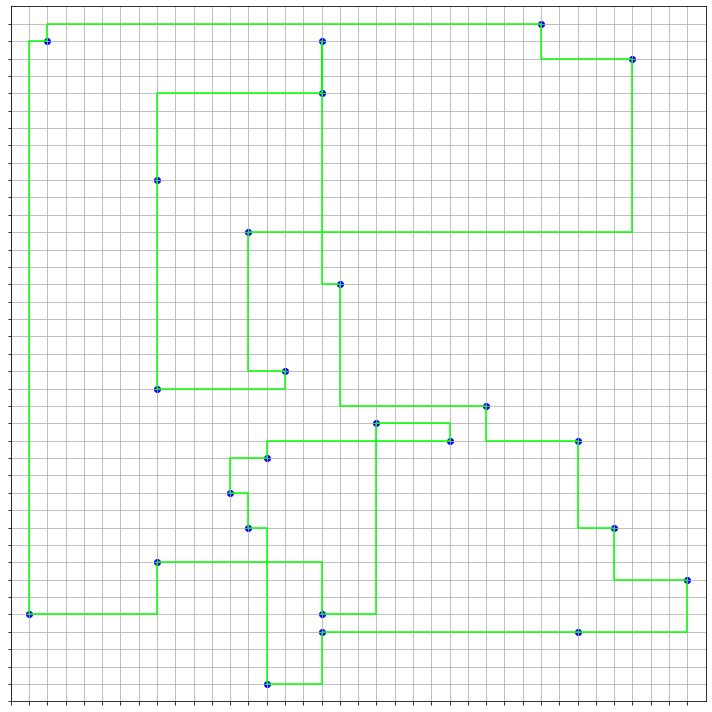

In [ ]:
hc = HillClimb(100, l1_distance)
HTML(visualize_hillclimb(X, hc).to_jshtml())

In [ ]:
print(cyclic_distance(hc.optimize_explain(hc.X)[-1], hc.dist))

204


### Задание 3 (4 балла)
Курьерское дело растет, теперь между городами блуждает большое количество курьеров, а их профессия вместе с известным маршрутом передается из поколение в поколение. Чем быстрее курьер способен обойти города - тем больше вероятность того, что он заработает себе на безоблачную старость и передаст свое дело потомкам. Симулируйте эволюцию курьеров, реализовав генетический алгоритм.

#### Методы
`optimize(X)` - выбирает лучшую перестановку из результатов `optimize_explain(X)`

`optimize_explain(X)` - возвращает список длины `iters` популяций размера `population` перестановок точек `X`, полученных в процессе оптимизации. На каждом шаге алгоритм должен оставлять только `survivors` выживших, следующая популяция должна быть сгенерирована из них

In [ ]:
class Genetic:
    def __init__(self, iters, population, survivors, distance):
        self.pop_size = population
        self.surv_size = survivors
        self.dist = distance
        self.iters = iters
        self.mut_num = 0.2
    
    def optimize(self, X):
        population = self.optimize_explain(X)[-1]
        dist = self.all_dist(population)

        best_idx = np.argmin(dist)
        return population[best_idx]
    
    def optimize_explain(self, X):
        self.X = X
        population, result = [], []

        first = np.arange(len(self.X))
        for i in range(self.pop_size):
            cur_pop = np.random.permutation(first)
            population.append(cur_pop)
        population = np.array(population)

        dist = self.all_dist(population)

        for iter in range(self.iters):
            # выкидываем худших
            best_sorted = np.argsort(dist)
            survivors = population[best_sorted][:self.surv_size]

            # скрещиваем всех со всеми
            population = []
        
            all_pairs = np.array(list(permutations(np.arange(len(survivors)), 2)))
            ran = np.random.choice(np.arange(len(all_pairs)), size = self.pop_size)
            all_pairs = all_pairs[ran]

            for i, j in all_pairs:
                new_sample = self.breed(survivors[i], survivors[j])
                population.append(new_sample)
            
            population = np.array(population)
            dist = self.all_dist(population)

            # добавляем мутации

            probs = dist / np.sum(dist)

            mutate_number = int(len(population) * self.mut_num)
            mutation_idx = np.random.choice(np.arange(len(population)), size=mutate_number, p=probs)

            for idx in mutation_idx:
                population[idx], dist[idx] = self.mutate(population[idx], dist[idx])

            result.append(population)

        return result


    def all_dist(self, population):
        dist = []

        for sample in population:
            dist.append(cyclic_distance(self.X[sample], self.dist))

        return np.array(dist)

    
    def mutate(self, sample, sample_dist):

        i, j = np.random.randint(len(sample), size=2)

        new_sample = sample.copy()
        new_sample[i], new_sample[j] = sample[j], sample[i]
            
        new_sample_dist = sample_dist - self.four_dists(sample, i, j)
        new_sample_dist = new_sample_dist + self.four_dists(new_sample, i, j)


        return new_sample, new_sample_dist

    
    def breed(self, first, second):
        new_sample = np.full_like(first, -1)

        first_n = len(new_sample) // 2
        idx_first = np.random.randint(first_n)
        new_sample[:first_n] = first[idx_first: idx_first + first_n]

        j = first_n
        for value in second:
            if value not in new_sample:
                new_sample[j] = value
                j += 1

                if j == len(new_sample):
                    break

        return new_sample


    def four_dists(self, perm, i, j):
        d1, d2, d3, d4, = 0, 0, 0, 0

        d1 = self.dist(X[perm][i], X[perm][(i-1)% len(self.X)])
        d2 = self.dist(X[perm][i], X[perm][(i+1)% len(self.X)])
        d3 = self.dist(X[perm][j], X[perm][(j-1)% len(self.X)])
        d4 = self.dist(X[perm][j], X[perm][(j+1)% len(self.X)])
            
        return d1 + d2 + d3 + d4


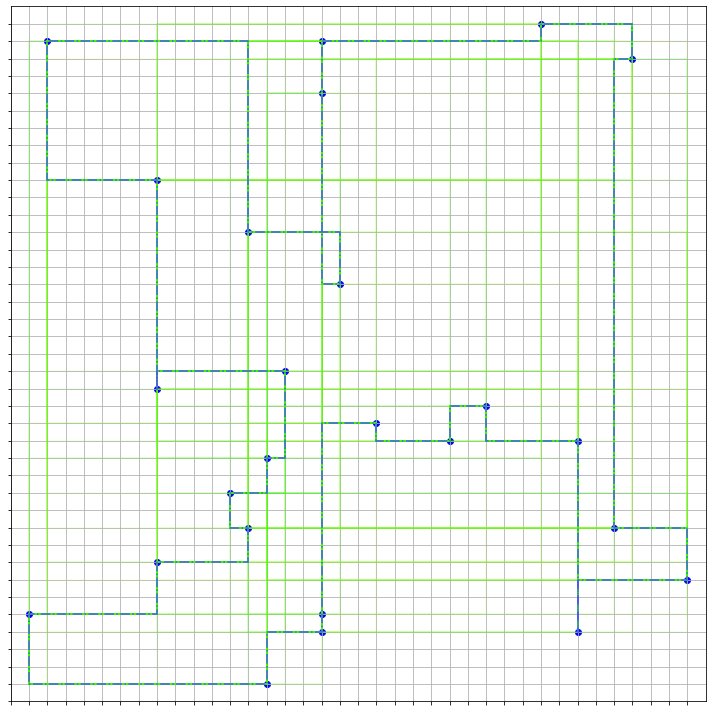

In [ ]:
gen = Genetic(200, 100, 20, l1_distance)
HTML(visualize_genetic(X, gen).to_jshtml())

In [ ]:
population = gen.optimize_explain(gen.X)[-1]
dist = gen.all_dist(population)
best = np.argsort(dist)[0]
print(cyclic_distance(population[best], gen.dist))


192
